<a href="https://colab.research.google.com/github/DhayuIntan/2141720026_PCVK_2023/blob/main/week-07/Week7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [16]:
from google.colab import drive

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
import math
from google.colab.patches import cv2_imshow
from PIL import Image as im

## <b> Konvulasi tanpa Library </b>
<b> Membuat fungsi konvulasi </b>
Fungsi konvolusi yang dibuat memiliki parameter berupa:
1. citra masukan,
2. kernel berupa matriks untuk memfilter citra,
3. nilai stride / besarnya pergeseran untuk setiap konvolusi,
4. nilai pad yang akan ditambakan pada citra


In [3]:
def convolution2d(img, kernel, stride, pad):

  img = np.pad(img, pad, mode='constant', constant_values=0)

  kernel_height, kernel_width = kernel.shape
  padded_height, padded_width = img.shape

  output_height = (padded_height - kernel_height) // stride + 1
  output_width = (padded_width - kernel_width) // stride + 1

  img2 = np.zeros((output_height, output_width)).astype(np.float32)

  # convolution process
  for y in range(0, output_height):
    for x in range(0, output_width):
      img2[y][x] = np.sum(img[y * stride:y * stride + kernel_height, x * stride:x * stride + kernel_width] * kernel).astype(np.float32)

  return img2

In [4]:
img_m = cv.imread('/content/drive/MyDrive/Images/female.tiff')
img_s = cv.resize(img_m, (0,0), fx=0.5, fy=0.5)
img_gray = cv.cvtColor(img_m, cv.COLOR_BGR2GRAY)

### <b> Menentukan kernel yang akan digunakan dan memanggil fungsi konvolusi

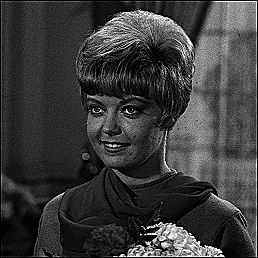

In [5]:
kernel_sharpen = np.array([[0, -1, 0],
                           [-1, 5, -1],
                           [0, -1, 0]])
cv2_imshow(convolution2d(img_gray, kernel_sharpen, 1, 2))

# **3. Membuat Image Filter untuk beberapa filter**

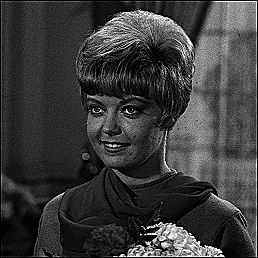

In [6]:
# Sharpen
kernel_sharpen = np.array([[0, -1, 0],
                           [-1, 5, -1],
                           [0, -1, 0]])
cv2_imshow(convolution2d(img_gray, kernel_sharpen, 1, 2))

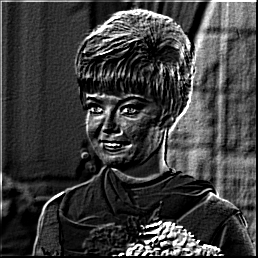

In [7]:
# Emboss
kernel_emboss = np.array([[-2, -1, 0],
                           [-1, 1, 1],
                           [0, 1, 2]])
cv2_imshow(convolution2d(img_gray, kernel_emboss, 1, 2))


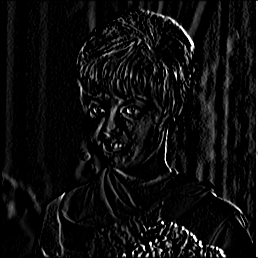

In [8]:
# Left Sobel Edge Detection
kernel_sobel = np.array([[1, 0, -1],
                           [2, 0, -2],
                           [1, 0, -1]])
cv2_imshow(convolution2d(img_gray, kernel_sobel, 1, 2))

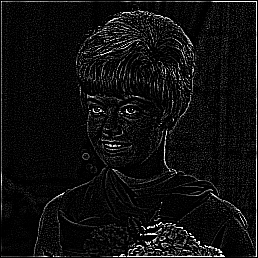

In [10]:
# Canny Edge Detection
kernel_canny = np.array([[-1, -1, -1],
                           [-1, 8, -1],
                           [-1, -1, -1]])
cv2_imshow(convolution2d(img_gray, kernel_canny, 1, 2))

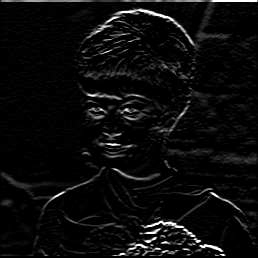

In [11]:
# Prewitt Edge Detection
kernel_prewitt = np.array([[-1, -1, -1],
                           [0, 0, 0],
                           [1, 1, 1]])
cv2_imshow(convolution2d(img_gray, kernel_prewitt, 1, 2))

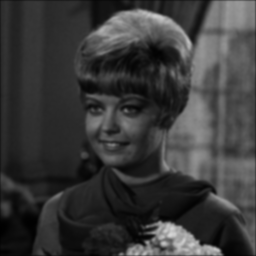

In [15]:
# 5x5 Gaussian Blur
gaussian_kernel = np.array([[1/256, 4/256, 6/256, 4/256, 1/256],
                           [4/256, 16/256, 24/256, 16/256, 4/256],
                           [6/256, 24/256, 36/256, 24/256, 6/256],
                           [4/256, 16/256, 24/256, 16/256, 4/256],
                           [1/256, 4/256, 6/256, 4/256, 1/256],])
cv2_imshow(convolution2d(img_gray, gaussian_kernel, 1, 2))

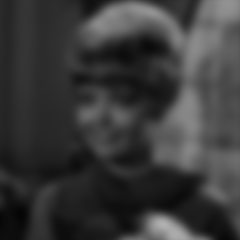

In [13]:
# 21x21 Gaussian Blur
kernel_size = 21
sigma = math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
gauss_kernel = gaussian_kernel @ gaussian_kernel.transpose()

cv2_imshow(convolution2d(img_gray, gauss_kernel, 1, 2))

# **Tugas**
Diketahui dataset KTP dengan kondisi citra yang berbeda. Lakukan perbaikan melalui
implementasi teknik filterisasi dan detection setiap citra. Terapkan juga histogram equalization dan
operasi aritmatika sebagai Teknik pendukung perbaikan citra KTP.

In [21]:
def Brightness (image, brightness):
  brightness_image = np.zeros(image.shape, image.dtype)

  for y in range(image.shape[0]):
    for x in range(image.shape[1]):
      for c in range(image.shape[2]):
        brightness_image[y,x,c] = np.clip(image[y,x,c] + brightness, 0, 255)

  return brightness_image

def hist_equ (image):
  channels = cv.split(image)
  eq_channels = []
  for ch, color in zip(channels, ["r", "g", "b"]):
    eq_channels.append(cv.equalizeHist(ch))

  eq_image = cv.merge(eq_channels)

  return eq_image

def adjust_contrast(image, alpha):
  adjusted_image = cv2.convertScaleAbs(image, alpha=alpha, beta=0)
  return adjusted_image

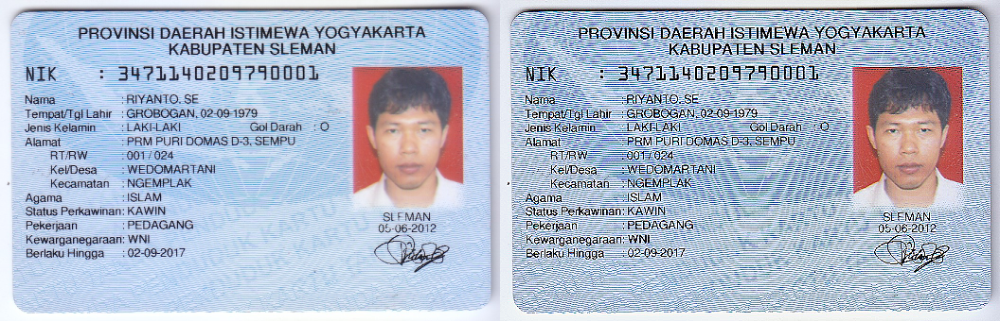

In [26]:
import cv2
ktp1 = cv.imread('/content/drive/MyDrive/Images/KTP_More/ktp.png')
ktp1_resize = cv.resize(ktp1, (0,0), fx=0.5, fy=0.5)
brightness = Brightness(ktp1_resize, -10)
result = cv2.filter2D(brightness, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp1_resize, result))
cv2_imshow(final_frame)

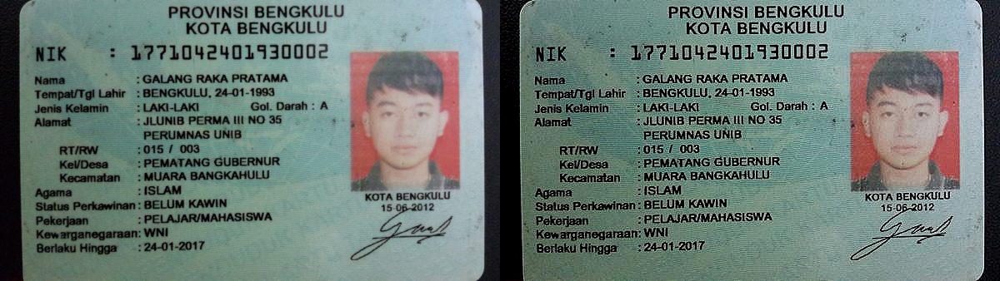

In [40]:
import cv2
ktp1_2 = cv.imread('/content/drive/MyDrive/Images/KTP_More/ktp1.png')
brightness = Brightness(ktp1_2, -10)
result = cv2.filter2D(brightness, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp1_2, result))
cv2_imshow(final_frame)

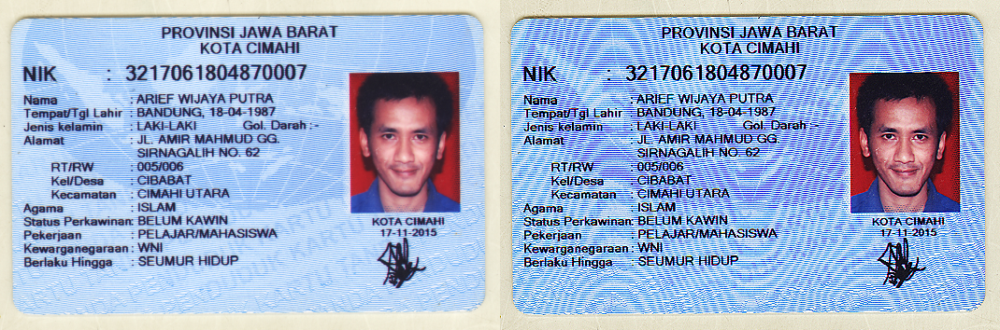

In [27]:
import cv2
ktp2 = cv.imread('/content/drive/MyDrive/Images/KTP_More/ktp2.png')
ktp2_resize = cv.resize(ktp2, (0,0), fx=0.5, fy=0.5)
brightness = Brightness(ktp2_resize, -10)
result = cv2.filter2D(brightness, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp2_resize, result))
cv2_imshow(final_frame)

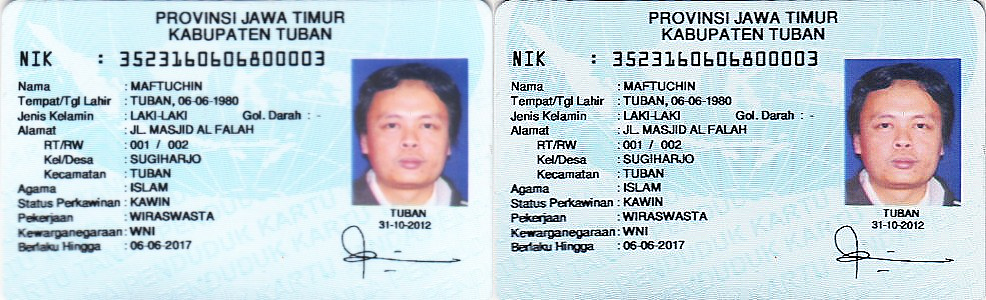

In [29]:
import cv2
ktp3 = cv.imread('/content/drive/MyDrive/Images/KTP_More/ktp3.png')
brightness = Brightness(ktp3, -10)
result = cv2.filter2D(brightness, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp3, result))
cv2_imshow(final_frame)

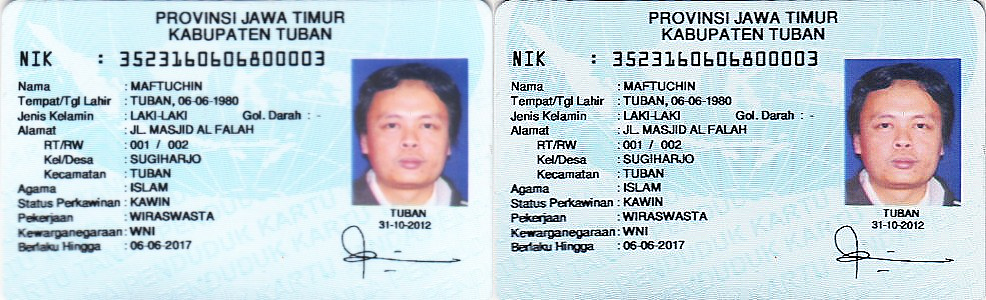

In [32]:
import cv2
ktp4 = cv.imread('/content/drive/MyDrive/Images/KTP_More/ktp4.png')
brightness = Brightness(ktp4, -10)
result = cv2.filter2D(brightness, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp4, result))
cv2_imshow(final_frame)

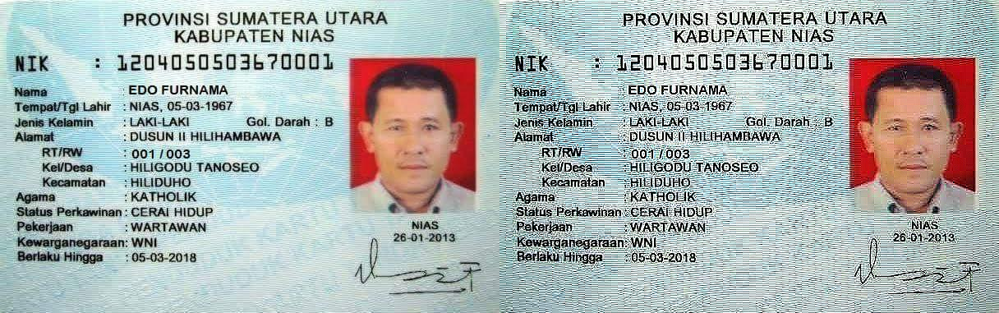

In [33]:
import cv2
ktp5 = cv.imread('/content/drive/MyDrive/Images/KTP_More/ktp5.png')
brightness = Brightness(ktp5, -10)
result = cv2.filter2D(brightness, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp5, result))
cv2_imshow(final_frame)

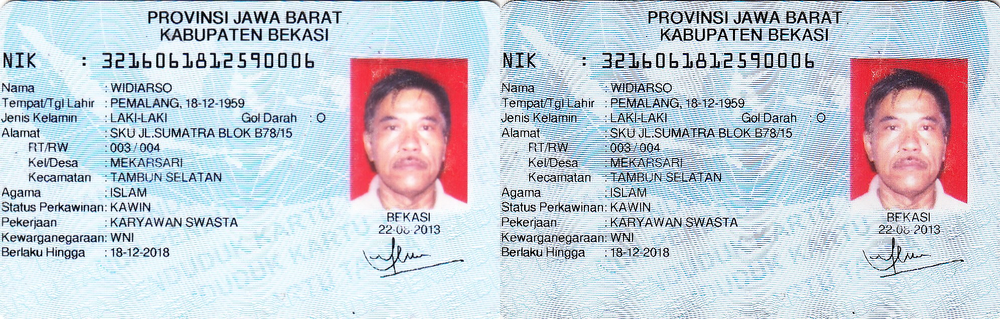

In [34]:
import cv2
ktp6 = cv.imread('/content/drive/MyDrive/Images/KTP_More/ktp6.png')
brightness = Brightness(ktp6, -10)
result = cv2.filter2D(brightness, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp6, result))
cv2_imshow(final_frame)

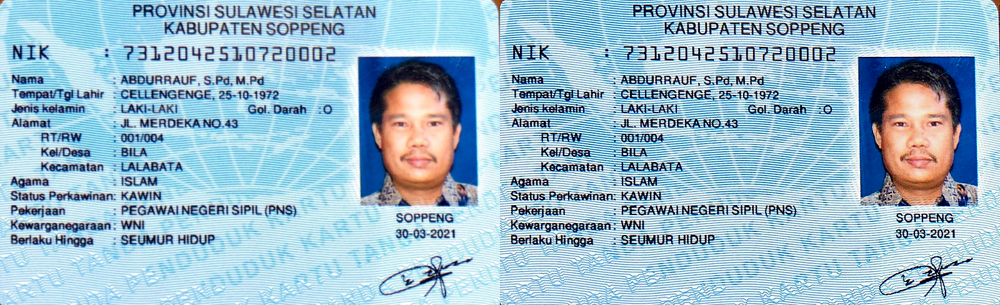

In [39]:
import cv2
ktp7 = cv.imread('/content/drive/MyDrive/Images/KTP_More/KTP7.jpeg')
brightness = Brightness(ktp7, -10)
result = cv2.filter2D(brightness, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp7, result))
cv2_imshow(final_frame)